# Automated PCB Defect Inspection using YOLOv8

This project implements an automated visual quality inspection system for printed circuit boards (PCBs).
The system detects, localizes, and classifies multiple PCB defect types using a YOLOv8 object detection model.

Detected defect classes: ["missing_hole","mouse_bite","open_circuit","short","spur","spurious_copper"]

For each detected defect, the system outputs:
- Bounding box
- Defect type
- Confidence score
- Defect center (x, y)
- Severity level

In [1]:
import numpy as np
import torch
import json
import xml.etree.ElementTree as ET
from PIL import Image
import shutil
import random
import cv2
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO

In [2]:
print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
%matplotlib inline

PyTorch version: 2.5.1+cu121
CUDA available: True


# Paths

In [3]:
root = Path(".")

data_dir = root / "data"
image_dir = data_dir / "images"
annot_dir = data_dir / "Annotations"
negative_dir = data_dir / "PCB_USED"

yolo_dir = root / "yolo_data"
yolo_images = yolo_dir / "images"
yolo_labels = yolo_dir / "labels"

for split in ["train", "val"]:
    (yolo_images / split).mkdir(parents=True, exist_ok=True)
    (yolo_labels / split).mkdir(parents=True, exist_ok=True)

# Defining Classes

In [4]:
classes = [
    "missing_hole",
    "mouse_bite",
    "open_circuit",
    "short",
    "spur",
    "spurious_copper"
]

class_to_id = {name: i for i, name in enumerate(classes)}

In [5]:
# check annotation file extension
example_dir = next(annot_dir.iterdir())
example_file = next(example_dir.iterdir())
print("Example annotation file:", example_file)

Example annotation file: data\Annotations\Missing_hole\01_missing_hole_01.xml


# XML to YOLO conversion

In [6]:
def convert_voc_to_yolo(xml_path, img_path, label_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    img = Image.open(img_path)
    img_w, img_h = img.size

    yolo_lines = []

    for obj in root.findall("object"):
        class_name = obj.find("name").text.lower()
        if class_name not in class_to_id:
            continue

        class_id = class_to_id[class_name]

        bndbox = obj.find("bndbox")
        xmin = float(bndbox.find("xmin").text)
        ymin = float(bndbox.find("ymin").text)
        xmax = float(bndbox.find("xmax").text)
        ymax = float(bndbox.find("ymax").text)

        # convert to YOLO format
        x_center = ((xmin + xmax) / 2) / img_w
        y_center = ((ymin + ymax) / 2) / img_h
        width = (xmax - xmin) / img_w
        height = (ymax - ymin) / img_h

        yolo_lines.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

    with open(label_path, "w") as f:
        for line in yolo_lines:
            f.write(line + "\n")

# Prepare Image–Annotation Pairs
- flattens all class folders
- matches images ↔ XMLs
- prepares a master list

In [7]:
samples = []

for class_dir in image_dir.iterdir():
    if not class_dir.is_dir():
        continue

    class_name = class_dir.name.lower()

    for img_path in class_dir.glob("*.jpg"):
        xml_path = annot_dir / class_dir.name / img_path.with_suffix(".xml").name
        if xml_path.exists():
            samples.append((img_path, xml_path))

In [8]:
print("Total defect samples:", len(samples))

Total defect samples: 693


In [9]:
# Add Defect-Free Images
negative_samples = list(negative_dir.glob("*.jpg"))
print("Defect-free images:", len(negative_samples))

Defect-free images: 10


# Train / Val Split

In [10]:
random.seed(42)
random.shuffle(samples)

split_idx = int(0.8 * len(samples))
train_samples = samples[:split_idx]
val_samples = samples[split_idx:]

# Writing inYOLO Dataset (Images + Labels)

In [11]:
def process_samples(sample_list, split):
    for img_path, xml_path in sample_list:
        dst_img = yolo_images / split / img_path.name
        dst_lbl = yolo_labels / split / img_path.with_suffix(".txt").name

        shutil.copy(img_path, dst_img)
        convert_voc_to_yolo(xml_path, img_path, dst_lbl)

process_samples(train_samples, "train")
process_samples(val_samples, "val")

In [12]:
#Add Defect-Free Images to Training Set
for img_path in negative_samples:
    dst_img = yolo_images / "train" / img_path.name
    dst_lbl = yolo_labels / "train" / img_path.with_suffix(".txt").name

    shutil.copy(img_path, dst_img)
    dst_lbl.touch()  # empty label file

In [13]:
train_images = len(list((yolo_images / "train").glob("*.jpg")))
train_labels = len(list((yolo_labels / "train").glob("*.txt")))

val_images = len(list((yolo_images / "val").glob("*.jpg")))
val_labels = len(list((yolo_labels / "val").glob("*.txt")))

print("Train images:", train_images)
print("Train labels:", train_labels)
print("Val images:", val_images)
print("Val labels:", val_labels)

Train images: 564
Train labels: 564
Val images: 139
Val labels: 139


## Yolo Dataset YAML

In [14]:
dataset_yaml = f"""
path: {yolo_dir.resolve()}
train: images/train
val: images/val

names:
"""
for i, name in enumerate(classes):
    dataset_yaml += f"  {i}: {name}\n"

yaml_path = root / "pcb.yaml"
with open(yaml_path, "w") as f:
    f.write(dataset_yaml)

print("Saved dataset config to:", yaml_path)

Saved dataset config to: pcb.yaml


# Training YOLOv8

In [15]:
from ultralytics import YOLO

model = YOLO("yolov8s.pt")

results = model.train(
    data=str(yaml_path),
    epochs=20,
    imgsz=640,
    batch=16,
    project="runs",
    name="pcb_yolov8"
)

Ultralytics 8.3.252  Python-3.11.14 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12282MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=pcb.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=pcb_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tr

# Visualising Results

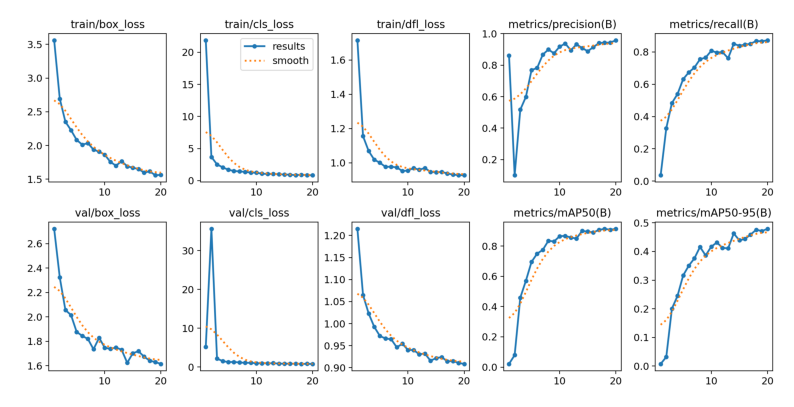

In [16]:
img = Image.open(r"C:/Users/Archit/Desktop/Sapien_Robotics_Intern/pcb-defect-inspection/runs/pcb_yolov8/results.png")
plt.figure(figsize=(10,6))
plt.imshow(img)
plt.axis("off");

# Inference on Sample Images

In [17]:
trained_model = YOLO(root / "runs/pcb_yolov8/weights/best.pt")

sample_images = list((yolo_images / "val").glob("*.jpg"))[:5]
preds = trained_model.predict(sample_images, conf=0.3)
# run inference
preds = trained_model.predict(
    sample_images,
    conf=0.3,
    save=True   # this saves prediction images automatically
)


0: 352x640 3 missing_holes, 10.4ms
1: 352x640 3 missing_holes, 10.4ms
2: 352x640 3 missing_holes, 10.4ms
3: 352x640 (no detections), 10.4ms
4: 352x640 1 mouse_bite, 10.4ms
Speed: 1.8ms preprocess, 10.4ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 3 missing_holes, 8.3ms
1: 352x640 3 missing_holes, 8.3ms
2: 352x640 3 missing_holes, 8.3ms
3: 352x640 (no detections), 8.3ms
4: 352x640 1 mouse_bite, 8.3ms
Speed: 2.0ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
Results saved to C:\Users\Archit\Desktop\Sapien_Robotics_Intern\pcb-defect-inspection\runs\detect\predict2


# Extract Centers, Confidence, Severity 

In [18]:
def severity_from_bbox(bbox, img_area):
    box_area = (bbox[2] - bbox[0]) * (bbox[3] - bbox[1])
    ratio = box_area / img_area
    if ratio < 0.005:
        return "low"
    elif ratio < 0.02:
        return "medium"
    else:
        return "high"


all_results = []

for r in preds:
    img_h, img_w = r.orig_shape
    img_area = img_h * img_w

    image_result = {
        "image": r.path,
        "defects": []
    }

    for box in r.boxes:
        x1, y1, x2, y2 = box.xyxy[0].tolist()
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])

        cx = int((x1 + x2) / 2)
        cy = int((y1 + y2) / 2)

        image_result["defects"].append({
            "defect_type": classes[cls_id],
            "confidence": round(conf, 3),
            "bbox": [int(x1), int(y1), int(x2), int(y2)],
            "center": [cx, cy],
            "severity": severity_from_bbox([x1,y1,x2,y2], img_area)
        })

    all_results.append(image_result)

print(json.dumps(all_results, indent=2))

[
  {
    "image": "yolo_data\\images\\val\\01_missing_hole_04.jpg",
    "defects": [
      {
        "defect_type": "missing_hole",
        "confidence": 0.783,
        "bbox": [
          336,
          756,
          389,
          809
        ],
        "center": [
          363,
          782
        ],
        "severity": "low"
      },
      {
        "defect_type": "missing_hole",
        "confidence": 0.772,
        "bbox": [
          220,
          1003,
          277,
          1064
        ],
        "center": [
          248,
          1034
        ],
        "severity": "low"
      },
      {
        "defect_type": "missing_hole",
        "confidence": 0.611,
        "bbox": [
          1621,
          220,
          1675,
          276
        ],
        "center": [
          1648,
          248
        ],
        "severity": "low"
      }
    ]
  },
  {
    "image": "yolo_data\\images\\val\\01_missing_hole_07.jpg",
    "defects": [
      {
        "defect_type": "missi

# Save Structured Output

In [19]:
with open("results.json", "w") as f:
    json.dump(all_results, f, indent=2)

print("Saved results.json")

Saved results.json


# Loading model

In [20]:
from ultralytics import YOLO
from pathlib import Path

# project root
root = Path(".")

# path to trained weights
model_path = root / "runs/pcb_yolov8/weights/best.pt"

# load model
trained_model = YOLO(model_path)

print(f"Loaded model from: {model_path}")

Loaded model from: runs\pcb_yolov8\weights\best.pt


In [21]:
preds = trained_model.predict(
    source=sample_images,
    conf=0.3,
    device=0
)


0: 352x640 3 missing_holes, 12.2ms
1: 352x640 3 missing_holes, 12.2ms
2: 352x640 3 missing_holes, 12.2ms
3: 352x640 (no detections), 12.2ms
4: 352x640 1 mouse_bite, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)


In [22]:
print(trained_model.device)

cuda:0


# Visualizing Preds

In [42]:
# Simple severity heuristic based on bounding box area ratio.
def severity_from_bbox(bbox, img_area):
    box_area = (bbox[2] - bbox[0]) * (bbox[3] - bbox[1])
    ratio = box_area / img_area

    if ratio < 0.001:
        return "low"
    elif ratio < 0.005:
        return "medium"
    else:
        return "high"

Analyzes a PCB image, detects and localizes defects, classifies them,
computes defect centers and severity, and visualizes results.

Returns:
    List of defect dictionaries (structured output).

In [43]:
def analyze_and_plot_predictions(result, classes):
    """
    Analyzes an input image, detects & localizes defects,
    classifies them with confidence, computes (x, y) centers
    and severity, and visualizes results.
    """

    img = cv2.imread(result.path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_h, img_w = img.shape[:2]
    img_area = img_h * img_w

    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.imshow(img)

    defects = []

    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])

        cx = int((x1 + x2) / 2)
        cy = int((y1 + y2) / 2)

        severity = severity_from_bbox([x1, y1, x2, y2], img_area)

        defect_info = {
            "defect_type": classes[cls_id],
            "confidence": round(conf, 3),
            "bbox": [x1, y1, x2, y2],
            "center": [cx, cy],
            "severity": severity
        }

        defects.append(defect_info)

        # draw bounding box
        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=1,
            edgecolor="lime",
            facecolor="none"
        )
        ax.add_patch(rect)

        # clean label
        label = f"{classes[cls_id]} | {conf:.2f} | {severity}"

        ax.text(
            x1 + 3,
            y1 - 25,
            label,
            fontsize=9,
            color="lime",
            #bbox=dict(facecolor="black", alpha=0.6, pad=2)
        )

    ax.axis("off")
    plt.show()

    return defects

In [44]:
def print_defects_nicely(defects):
    for i, d in enumerate(defects, 1):
        print(f"Defect {i}")
        print(f"  Type      : {d['defect_type']}")
        print(f"  Confidence: {d['confidence']}")
        print(f"  Center    : (x={d['center'][0]}, y={d['center'][1]})")
        print(f"  Severity  : {d['severity']}")
        print("-" * 30)

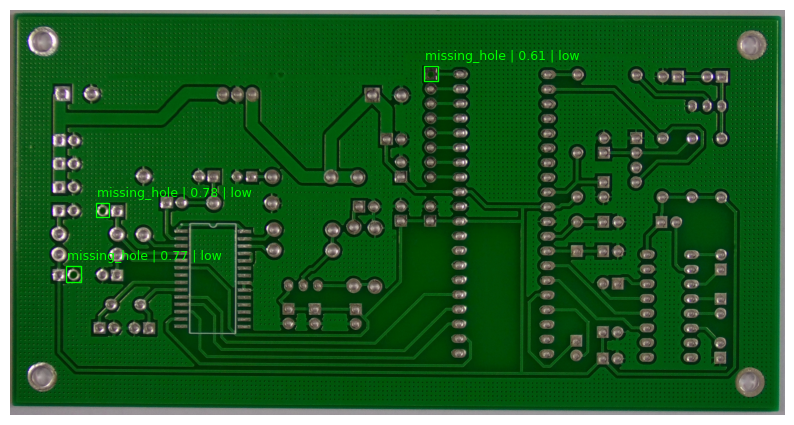

Defect 1
  Type      : missing_hole
  Confidence: 0.783
  Center    : (x=362, y=782)
  Severity  : low
------------------------------
Defect 2
  Type      : missing_hole
  Confidence: 0.772
  Center    : (x=248, y=1033)
  Severity  : low
------------------------------
Defect 3
  Type      : missing_hole
  Confidence: 0.611
  Center    : (x=1648, y=248)
  Severity  : low
------------------------------


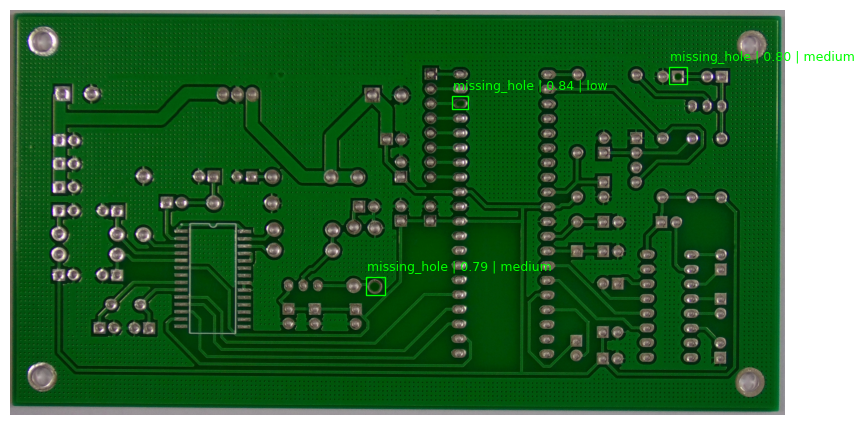

Defect 1
  Type      : missing_hole
  Confidence: 0.835
  Center    : (x=1762, y=362)
  Severity  : low
------------------------------
Defect 2
  Type      : missing_hole
  Confidence: 0.804
  Center    : (x=2614, y=257)
  Severity  : medium
------------------------------
Defect 3
  Type      : missing_hole
  Confidence: 0.792
  Center    : (x=1430, y=1080)
  Severity  : medium
------------------------------


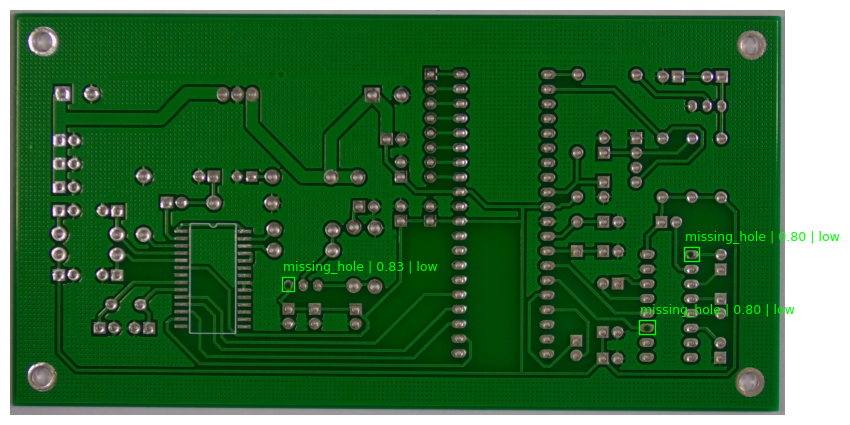

Defect 1
  Type      : missing_hole
  Confidence: 0.828
  Center    : (x=1089, y=1072)
  Severity  : low
------------------------------
Defect 2
  Type      : missing_hole
  Confidence: 0.8
  Center    : (x=2492, y=1242)
  Severity  : low
------------------------------
Defect 3
  Type      : missing_hole
  Confidence: 0.797
  Center    : (x=2668, y=955)
  Severity  : low
------------------------------


In [65]:
for r in preds[:3]:
    defects = analyze_and_plot_predictions(r, classes)
    print_defects_nicely(defects)

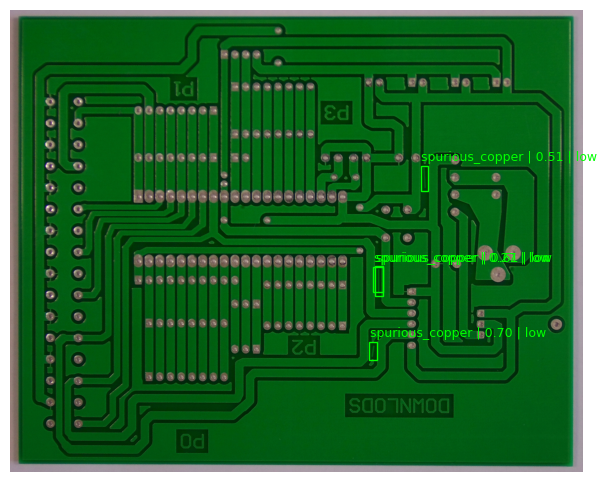

Defect 1
  Type      : spurious_copper
  Confidence: 0.696
  Center    : (x=1936, y=1818)
  Severity  : low
------------------------------
Defect 2
  Type      : spurious_copper
  Confidence: 0.608
  Center    : (x=1966, y=1445)
  Severity  : low
------------------------------
Defect 3
  Type      : spurious_copper
  Confidence: 0.505
  Center    : (x=2210, y=897)
  Severity  : low
------------------------------
Defect 4
  Type      : spurious_copper
  Confidence: 0.266
  Center    : (x=1962, y=1436)
  Severity  : low
------------------------------


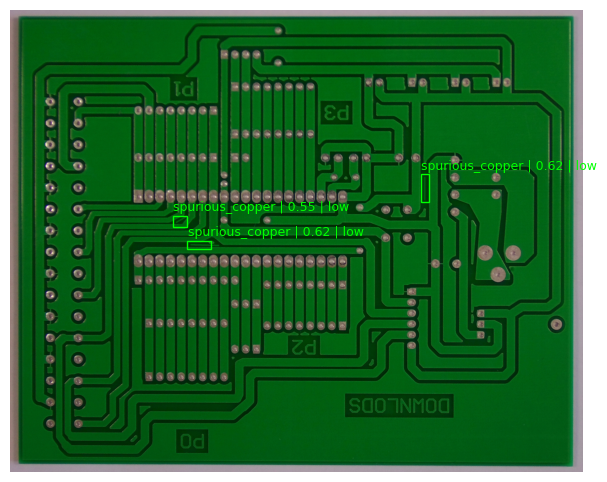

Defect 1
  Type      : spurious_copper
  Confidence: 0.622
  Center    : (x=1007, y=1250)
  Severity  : low
------------------------------
Defect 2
  Type      : spurious_copper
  Confidence: 0.618
  Center    : (x=2212, y=949)
  Severity  : low
------------------------------
Defect 3
  Type      : spurious_copper
  Confidence: 0.553
  Center    : (x=905, y=1127)
  Severity  : low
------------------------------


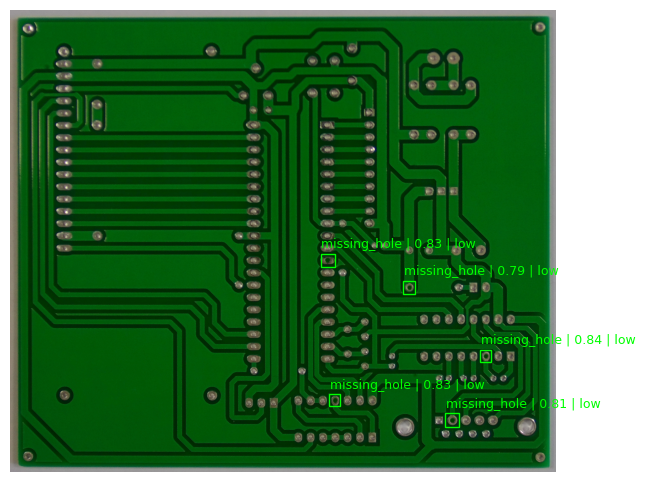

Defect 1
  Type      : missing_hole
  Confidence: 0.841
  Center    : (x=2219, y=1613)
  Severity  : low
------------------------------
Defect 2
  Type      : missing_hole
  Confidence: 0.832
  Center    : (x=1481, y=1167)
  Severity  : low
------------------------------
Defect 3
  Type      : missing_hole
  Confidence: 0.825
  Center    : (x=1514, y=1820)
  Severity  : low
------------------------------
Defect 4
  Type      : missing_hole
  Confidence: 0.81
  Center    : (x=2062, y=1913)
  Severity  : low
------------------------------
Defect 5
  Type      : missing_hole
  Confidence: 0.788
  Center    : (x=1862, y=1293)
  Severity  : low
------------------------------


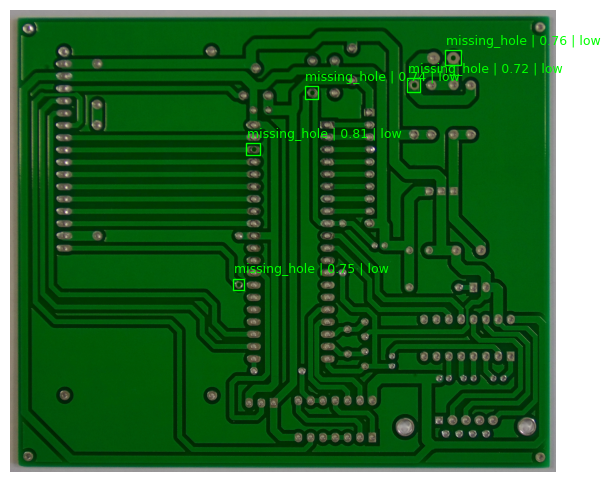

Defect 1
  Type      : missing_hole
  Confidence: 0.807
  Center    : (x=1135, y=649)
  Severity  : low
------------------------------
Defect 2
  Type      : missing_hole
  Confidence: 0.76
  Center    : (x=2067, y=222)
  Severity  : low
------------------------------
Defect 3
  Type      : missing_hole
  Confidence: 0.747
  Center    : (x=1067, y=1279)
  Severity  : low
------------------------------
Defect 4
  Type      : missing_hole
  Confidence: 0.737
  Center    : (x=1407, y=386)
  Severity  : low
------------------------------
Defect 5
  Type      : missing_hole
  Confidence: 0.724
  Center    : (x=1882, y=349)
  Severity  : low
------------------------------


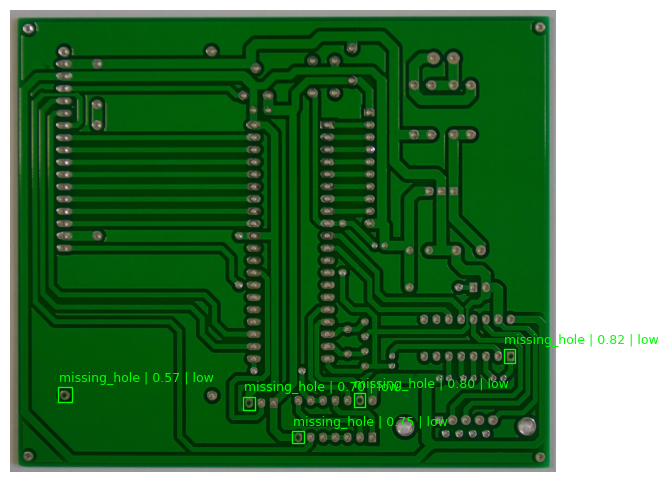

Defect 1
  Type      : missing_hole
  Confidence: 0.815
  Center    : (x=2331, y=1613)
  Severity  : low
------------------------------
Defect 2
  Type      : missing_hole
  Confidence: 0.796
  Center    : (x=1630, y=1821)
  Severity  : low
------------------------------
Defect 3
  Type      : missing_hole
  Confidence: 0.749
  Center    : (x=1342, y=1993)
  Severity  : low
------------------------------
Defect 4
  Type      : missing_hole
  Confidence: 0.698
  Center    : (x=1114, y=1835)
  Severity  : low
------------------------------
Defect 5
  Type      : missing_hole
  Confidence: 0.569
  Center    : (x=255, y=1795)
  Severity  : low
------------------------------


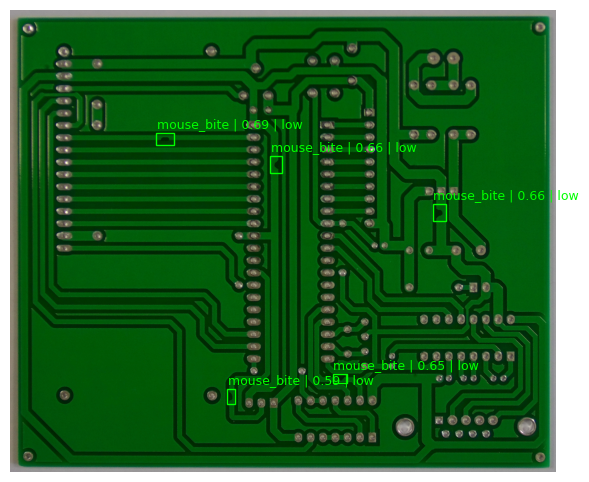

Defect 1
  Type      : mouse_bite
  Confidence: 0.688
  Center    : (x=722, y=601)
  Severity  : low
------------------------------
Defect 2
  Type      : mouse_bite
  Confidence: 0.658
  Center    : (x=1240, y=720)
  Severity  : low
------------------------------
Defect 3
  Type      : mouse_bite
  Confidence: 0.658
  Center    : (x=2003, y=945)
  Severity  : low
------------------------------
Defect 4
  Type      : mouse_bite
  Confidence: 0.651
  Center    : (x=1539, y=1720)
  Severity  : low
------------------------------
Defect 5
  Type      : mouse_bite
  Confidence: 0.591
  Center    : (x=1030, y=1803)
  Severity  : low
------------------------------


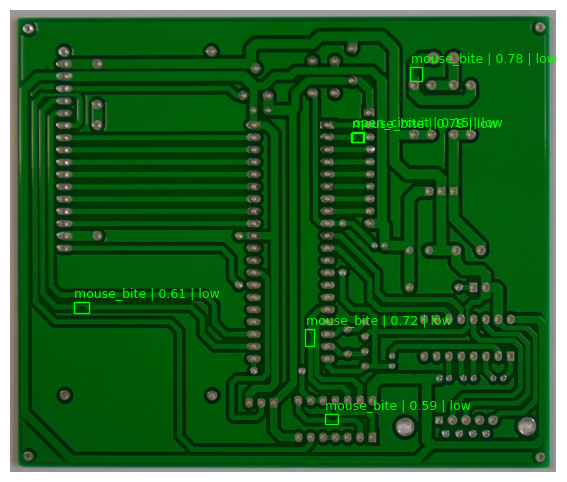

Defect 1
  Type      : mouse_bite
  Confidence: 0.782
  Center    : (x=1620, y=594)
  Severity  : low
------------------------------
Defect 2
  Type      : mouse_bite
  Confidence: 0.781
  Center    : (x=1894, y=299)
  Severity  : low
------------------------------
Defect 3
  Type      : mouse_bite
  Confidence: 0.718
  Center    : (x=1397, y=1527)
  Severity  : low
------------------------------
Defect 4
  Type      : mouse_bite
  Confidence: 0.608
  Center    : (x=333, y=1388)
  Severity  : low
------------------------------
Defect 5
  Type      : mouse_bite
  Confidence: 0.586
  Center    : (x=1499, y=1909)
  Severity  : low
------------------------------
Defect 6
  Type      : open_circuit
  Confidence: 0.149
  Center    : (x=1623, y=593)
  Severity  : low
------------------------------


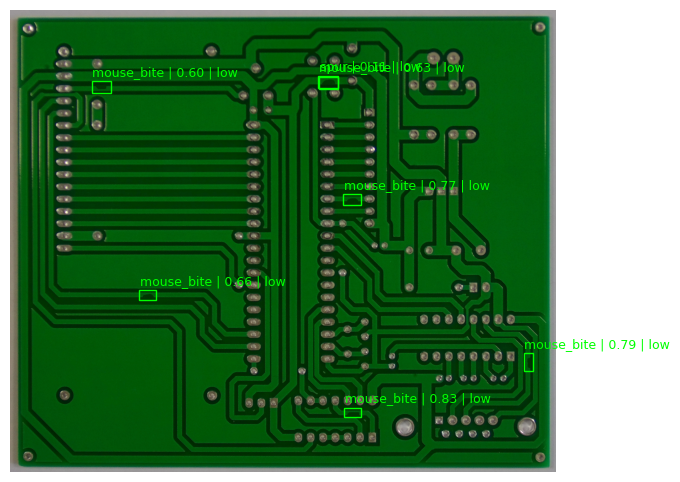

Defect 1
  Type      : mouse_bite
  Confidence: 0.828
  Center    : (x=1598, y=1878)
  Severity  : low
------------------------------
Defect 2
  Type      : mouse_bite
  Confidence: 0.785
  Center    : (x=2418, y=1644)
  Severity  : low
------------------------------
Defect 3
  Type      : mouse_bite
  Confidence: 0.77
  Center    : (x=1595, y=885)
  Severity  : low
------------------------------
Defect 4
  Type      : mouse_bite
  Confidence: 0.655
  Center    : (x=640, y=1330)
  Severity  : low
------------------------------
Defect 5
  Type      : mouse_bite
  Confidence: 0.635
  Center    : (x=1484, y=335)
  Severity  : low
------------------------------
Defect 6
  Type      : mouse_bite
  Confidence: 0.604
  Center    : (x=425, y=359)
  Severity  : low
------------------------------
Defect 7
  Type      : spur
  Confidence: 0.107
  Center    : (x=1485, y=338)
  Severity  : low
------------------------------


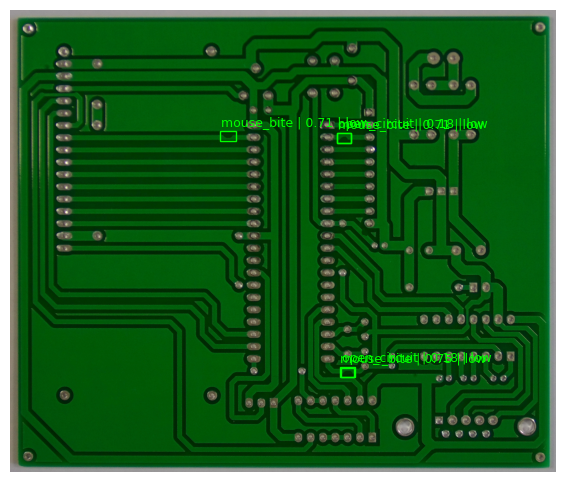

Defect 1
  Type      : mouse_bite
  Confidence: 0.755
  Center    : (x=1573, y=1688)
  Severity  : low
------------------------------
Defect 2
  Type      : mouse_bite
  Confidence: 0.715
  Center    : (x=1558, y=597)
  Severity  : low
------------------------------
Defect 3
  Type      : mouse_bite
  Confidence: 0.711
  Center    : (x=1016, y=588)
  Severity  : low
------------------------------
Defect 4
  Type      : open_circuit
  Confidence: 0.183
  Center    : (x=1559, y=598)
  Severity  : low
------------------------------
Defect 5
  Type      : open_circuit
  Confidence: 0.181
  Center    : (x=1575, y=1691)
  Severity  : low
------------------------------


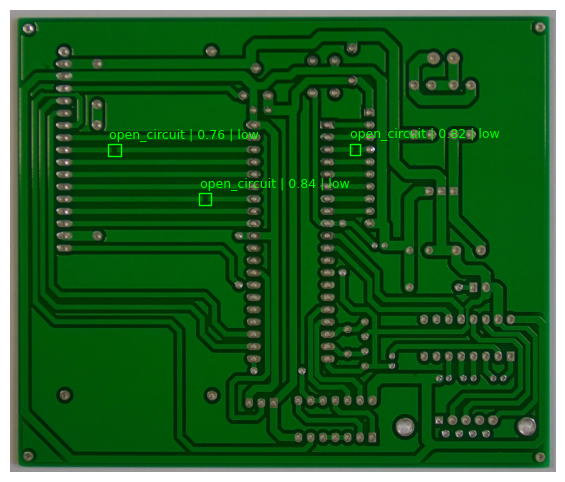

Defect 1
  Type      : open_circuit
  Confidence: 0.845
  Center    : (x=909, y=881)
  Severity  : low
------------------------------
Defect 2
  Type      : open_circuit
  Confidence: 0.823
  Center    : (x=1609, y=649)
  Severity  : low
------------------------------
Defect 3
  Type      : open_circuit
  Confidence: 0.764
  Center    : (x=487, y=652)
  Severity  : low
------------------------------


In [66]:
for r in preds2:
    defects = analyze_and_plot_predictions(r, classes)
    print_defects_nicely(defects)

Add metrics, before and after fiine tuning
missclastifed examples
Explain why that issue is there.

## Before Fine-Tuning Metics

In [46]:
from ultralytics import YOLO

baseline_model = YOLO("yolov8s.pt")

baseline_metrics = baseline_model.val(
    data="pcb.yaml",
    imgsz=640,
    conf=0.25
)

print("Baseline metrics (before fine-tuning):")
print(baseline_metrics)

Ultralytics 8.3.252  Python-3.11.14 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12282MiB)
YOLOv8s summary (fused): 72 layers, 11,156,544 parameters, 0 gradients, 28.6 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 2013.7236.7 MB/s, size: 1270.1 KB)
val: Scanning C:\Users\Archit\Desktop\Sapien_Robotics_Intern\pcb-defect-inspection\yolo_data\labels\val.cache... 139 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 139/139  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 4.9it/s 1.8s0.3ss
                   all        139        602          0          0          0          0
                person         26        115          0          0          0          0
               bicycle         23        107          0          0          0          0
                   car         20         78          0          0          0          0
            motorcycle         20         77          0 

## After Fine-tune Mertics

In [47]:
finetuned_model = YOLO("runs/pcb_yolov8/weights/best.pt")

finetuned_metrics = finetuned_model.val(
    data="pcb.yaml",
    imgsz=640,
    conf=0.25
)

print("Fine-tuned metrics (after training):")
print(finetuned_metrics)

Ultralytics 8.3.252  Python-3.11.14 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12282MiB)
Model summary (fused): 72 layers, 11,127,906 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 1605.0159.1 MB/s, size: 1189.4 KB)
val: Scanning C:\Users\Archit\Desktop\Sapien_Robotics_Intern\pcb-defect-inspection\yolo_data\labels\val.cache... 139 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 139/139  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.8it/s 2.3s0.2ss
                   all        139        602      0.958      0.872      0.927       0.53
          missing_hole         26        115          1          1      0.995      0.646
            mouse_bite         23        107      0.946      0.822      0.904        0.5
          open_circuit         20         78      0.931      0.846      0.914      0.514
                 short         20         77      0.986   

In [48]:
def show_image(path, title=None):
    img = Image.open(path)
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis("off")
    if title:
        plt.title(title)
    plt.show()

### Before fine tuning plots

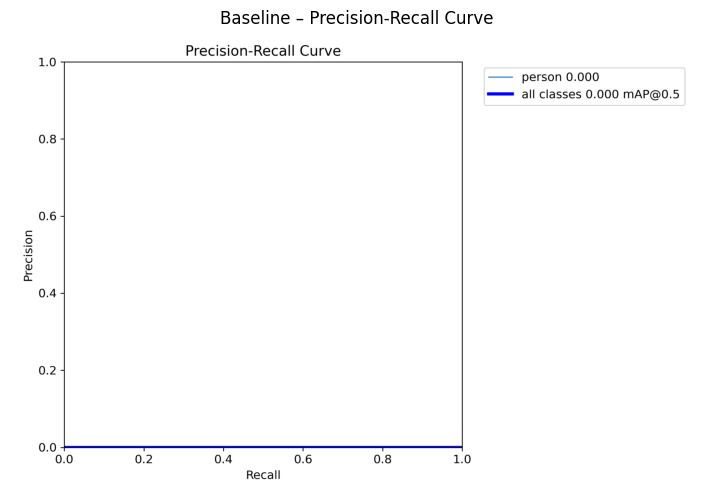

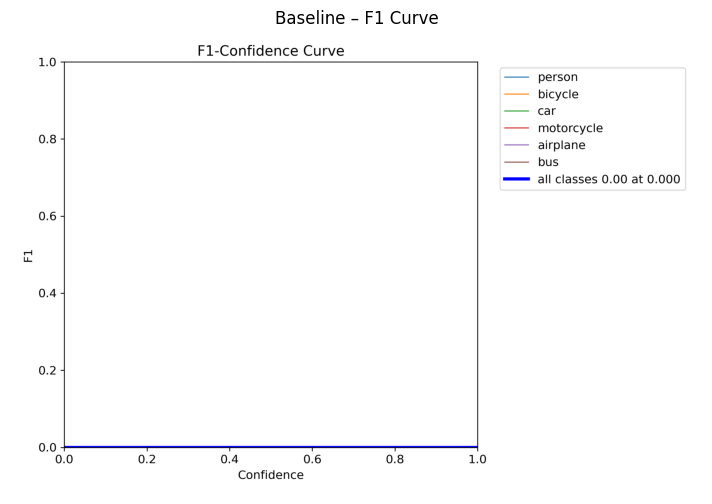

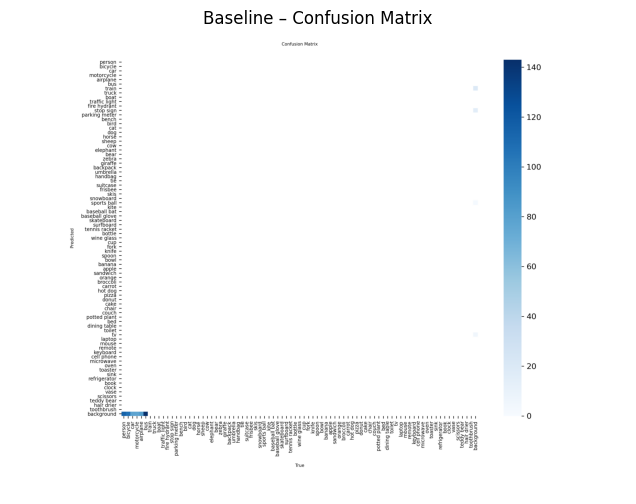

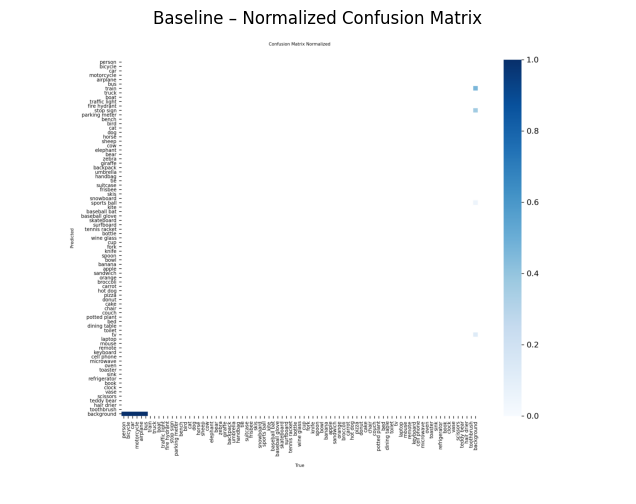

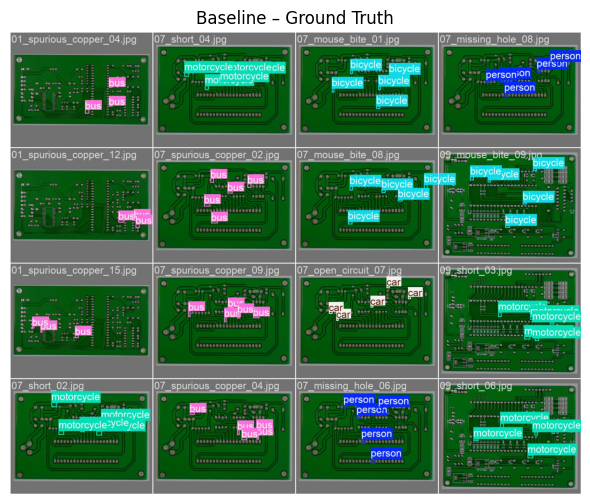

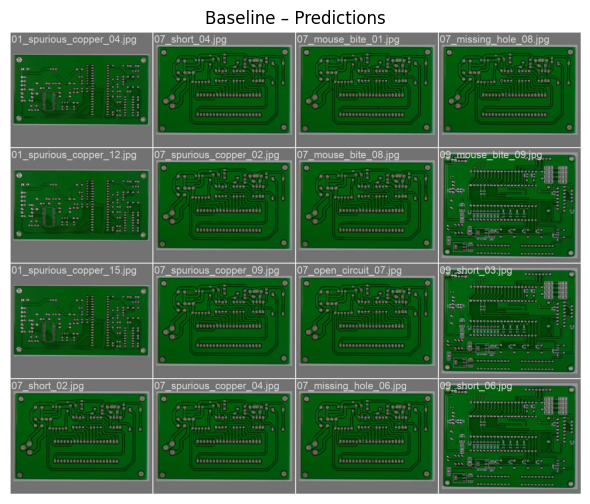

In [49]:
baseline_dir = Path("runs/detect/val")

show_image(baseline_dir / "BoxPR_curve.png", "Baseline – Precision-Recall Curve")
show_image(baseline_dir / "BoxF1_curve.png", "Baseline – F1 Curve")
show_image(baseline_dir / "confusion_matrix.png", "Baseline – Confusion Matrix")
show_image(baseline_dir / "confusion_matrix_normalized.png", "Baseline – Normalized Confusion Matrix")
show_image(baseline_dir / "val_batch1_labels.jpg", "Baseline – Ground Truth")
show_image(baseline_dir / "val_batch1_pred.jpg", "Baseline – Predictions")

### After fine tuning plots

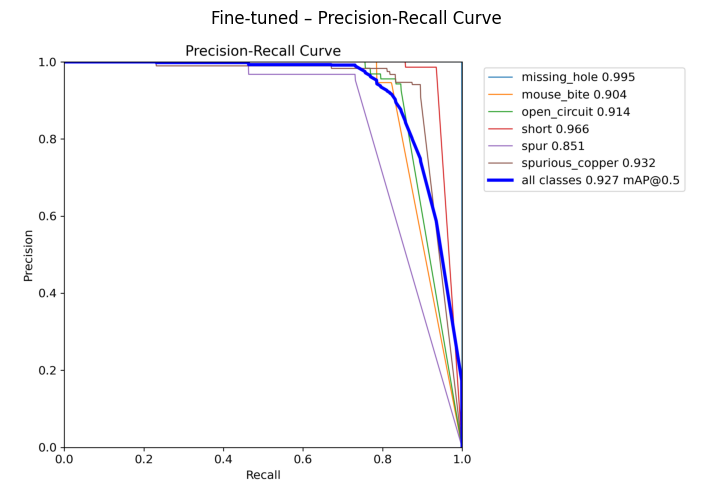

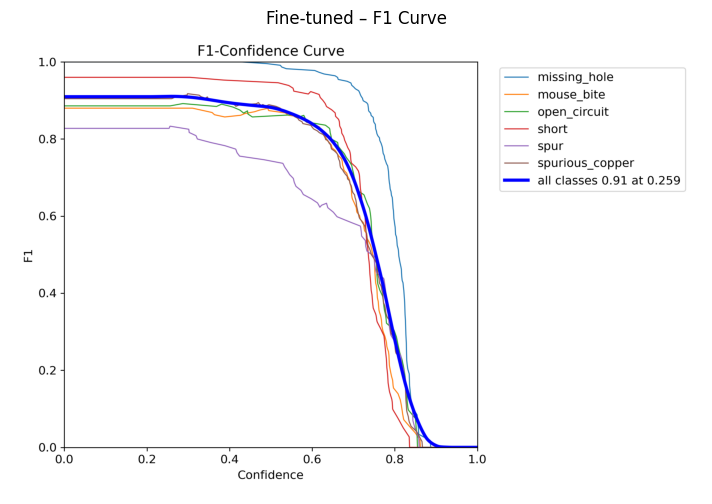

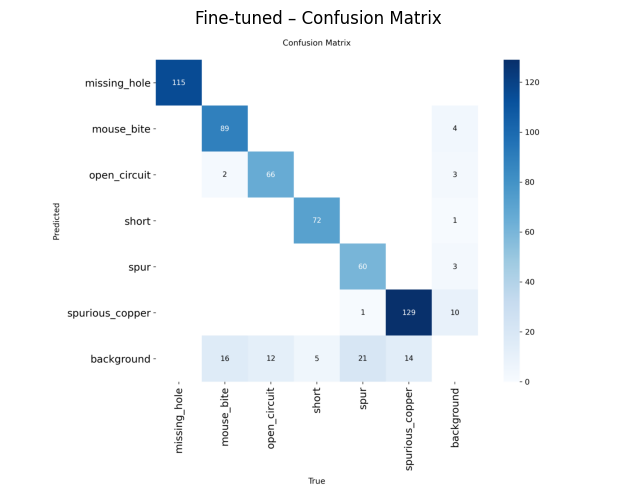

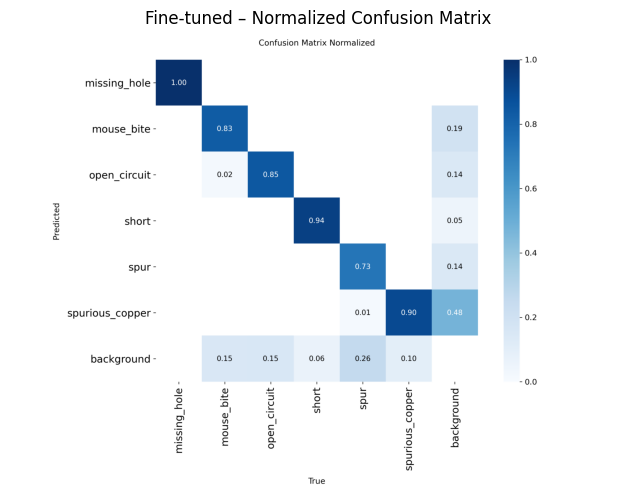

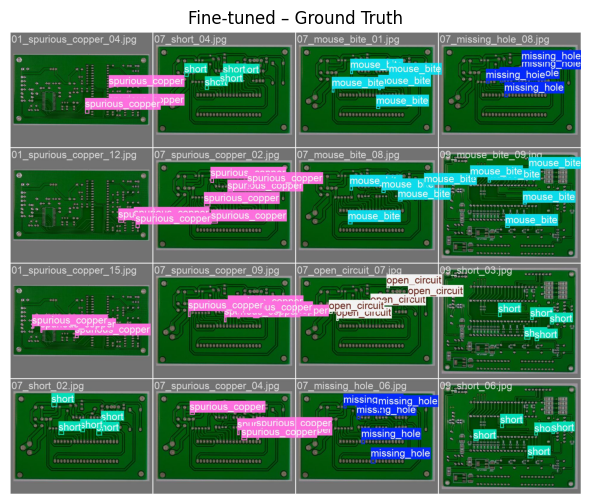

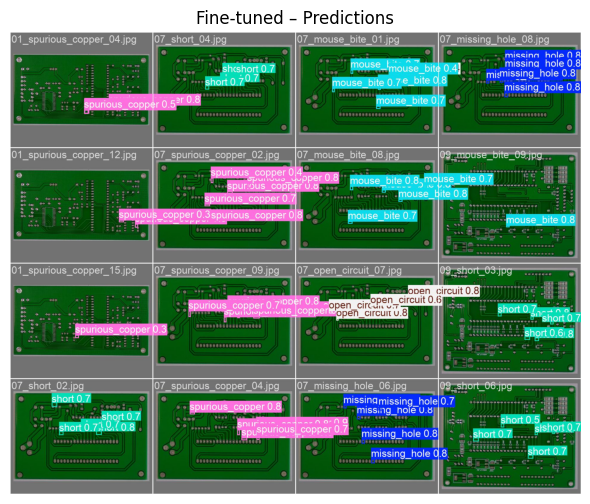

In [50]:
finetuned_dir = Path("runs/detect/val2")

show_image(finetuned_dir / "BoxPR_curve.png", "Fine-tuned – Precision-Recall Curve")
show_image(finetuned_dir / "BoxF1_curve.png", "Fine-tuned – F1 Curve")
show_image(finetuned_dir / "confusion_matrix.png", "Fine-tuned – Confusion Matrix")
show_image(finetuned_dir / "confusion_matrix_normalized.png", "Fine-tuned – Normalized Confusion Matrix")
show_image(finetuned_dir / "val_batch1_labels.jpg", "Fine-tuned – Ground Truth")
show_image(finetuned_dir / "val_batch1_pred.jpg", "Fine-tuned – Predictions")

### Before vs After Fine-tuning Evaluation

Baseline YOLOv8 trained on COCO shows zero detection performance on PCB defects, which is expected due to the absence of such classes in the pretraining dataset. Fine-tuning on PCB defect data leads to a substantial performance improvement, achieving 95.8% precision, 87.2% recall, and 92.7% mAP@0.5.

| Defect Type     | Images | Instances | Precision | Recall | mAP@0.5 | mAP@0.5:0.95 |
| --------------- | ------ | --------- | --------- | ------ | ------- | ------------ |
| **All**         | 139    | 602       | 0.958     | 0.872  | 0.927   | 0.530        |
| missing_hole    | 26     | 115       | 1.000     | 1.000  | 0.995   | 0.646        |
| mouse_bite      | 23     | 107       | 0.946     | 0.822  | 0.904   | 0.500        |
| open_circuit    | 20     | 78        | 0.931     | 0.846  | 0.914   | 0.514        |
| short           | 20     | 77        | 0.986     | 0.935  | 0.966   | 0.545        |
| spur            | 19     | 82        | 0.968     | 0.731  | 0.851   | 0.453        |
| spurious_copper | 31     | 143       | 0.914     | 0.895  | 0.932   | 0.520        |


Notes :
- Perfect detection on missing_hole at IoU 0.5, but localization tightness drops at higher IoUs (mAP@0.5:0.95).

- Spur has strong precision but weaker recall → model misses some thin defects.

Overall high mAP@0.5 (0.927) with expected drop at stricter IoUs, typical for small/elongated PCB defects.

## Visualise stuff

### Single helper to load GT boxes (YOLO format)

In [51]:
def load_gt_boxes_simple(img_path, label_dir, img_shape):
    h, w = img_shape[:2]
    label_path = label_dir / Path(img_path).with_suffix(".txt").name

    if not label_path.exists():
        return []

    gts = []
    for line in open(label_path):
        cls, xc, yc, bw, bh = map(float, line.split())
        x1 = int((xc - bw/2) * w)
        y1 = int((yc - bh/2) * h)
        x2 = int((xc + bw/2) * w)
        y2 = int((yc + bh/2) * h)
        gts.append((int(cls), [x1, y1, x2, y2]))
    return gts

### overlay function (GT + Predictions)

In [52]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2

def plot_gt_vs_pred_simple(result, classes, label_dir):
    img = cv2.cvtColor(cv2.imread(result.path), cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.imshow(img)

    # Ground truth (RED)
    for cls_id, (x1,y1,x2,y2) in load_gt_boxes_simple(result.path, label_dir, img.shape):
        ax.add_patch(patches.Rectangle((x1,y1), x2-x1, y2-y1,
                                       edgecolor="red", fill=False, linewidth=1))
        ax.text(x1, y1-20, f"GT:{classes[cls_id]}", color="red",)
                #bbox=dict(facecolor="red", alpha=0.7), fontsize=8)

    # Predictions (GREEN)
    for b in result.boxes:
        x1,y1,x2,y2 = map(int, b.xyxy[0])
        cls_id = int(b.cls[0])
        conf = float(b.conf[0])
        ax.add_patch(patches.Rectangle((x1,y1), x2-x1, y2-y1,
                                       edgecolor="lime", fill=False, linewidth=1))
        ax.text(x1, y1-20, f"P:{classes[cls_id]} {conf:.2f}", color="lime",)
                #bbox=dict(facecolor="lime", alpha=0.7), fontsize=8)

    ax.axis("off")
    plt.show()

### For failures / misscalssifications

In [57]:
from pathlib import Path

def analyze_detection_case(result, label_dir, conf_thresh=0.4):
    """
    Classifies each image into:
    - true_negative
    - missed_detection
    - low_confidence_prediction
    - normal_detection
    """
    failures = []

    # load ground-truth labels
    label_path = label_dir / Path(result.path).with_suffix(".txt").name
    has_gt = label_path.exists() and label_path.stat().st_size > 0

    has_pred = len(result.boxes) > 0

    # Case 1: true negative (correct no detection)
    if not has_gt and not has_pred:
        return {
            "case": "true_negative",
            "message": "No defect present and none detected"
        }

    # Case 2: missed detection
    if has_gt and not has_pred:
        return {
            "case": "missed_detection",
            "message": "Defect present but not detected"
        }

    # Case 3: predictions exist
    for box in result.boxes:
        conf = float(box.conf[0])
        if conf < conf_thresh:
            return {
                "case": "low_confidence_prediction",
                "confidence": round(conf, 3)
            }

    # Case 4: normal detection
    return {
        "case": "normal_detection",
        "message": "Defect detected with sufficient confidence"
    }


Failure in: yolo_data\images\val\01_mouse_bite_03.jpg


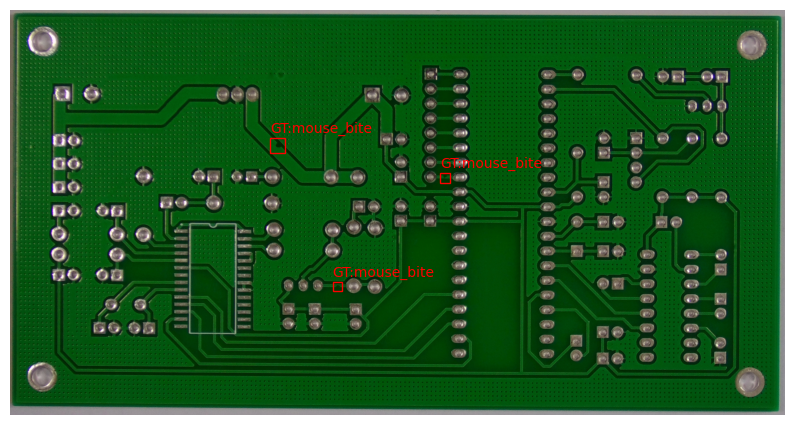


Failure in: yolo_data\images\val\01_mouse_bite_13.jpg


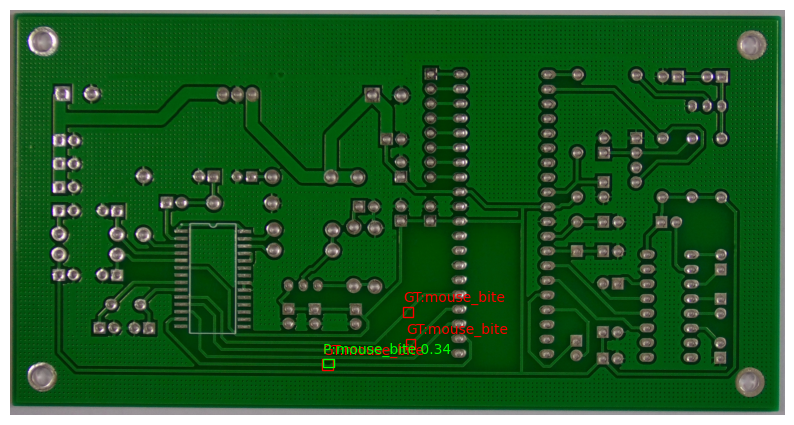

In [58]:
for r in preds:
    failures = analyze_failures(r, 200000.0)
    if failures:
        print(f"\nFailure in: {r.path}")
        plot_gt_vs_pred_simple(r, classes, yolo_labels / "val")

## For Correctly classifiiwed images

In [74]:
preds2 = trained_model.predict(
    source=list(Path("yolo_data/images/val").iterdir())[36:46],#17:30
    conf=0.1,
    device=0
)


0: 640x640 4 spurious_coppers, 37.6ms
1: 640x640 3 spurious_coppers, 37.6ms
2: 640x640 5 missing_holes, 37.6ms
3: 640x640 5 missing_holes, 37.6ms
4: 640x640 5 missing_holes, 37.6ms
5: 640x640 5 mouse_bites, 37.6ms
6: 640x640 5 mouse_bites, 1 open_circuit, 37.6ms
7: 640x640 6 mouse_bites, 1 spur, 37.6ms
8: 640x640 3 mouse_bites, 2 open_circuits, 37.6ms
9: 640x640 3 open_circuits, 37.6ms
Speed: 6.3ms preprocess, 37.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


# Take images of missing hole, mouse bite, open circuit from here for GITHUB


Image: yolo_data\images\val\04_spurious_copper_14.jpg


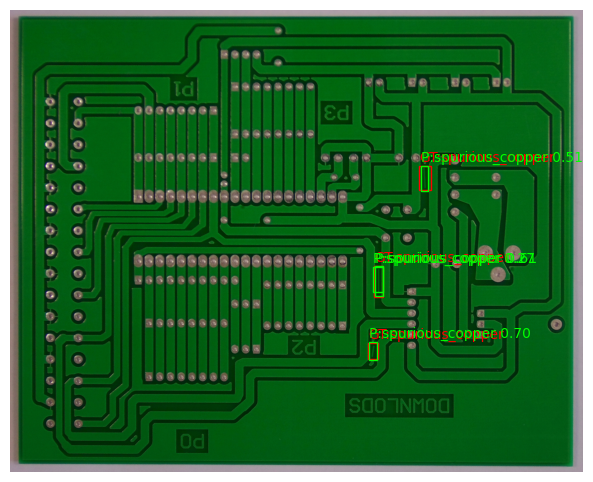


Image: yolo_data\images\val\04_spurious_copper_20.jpg


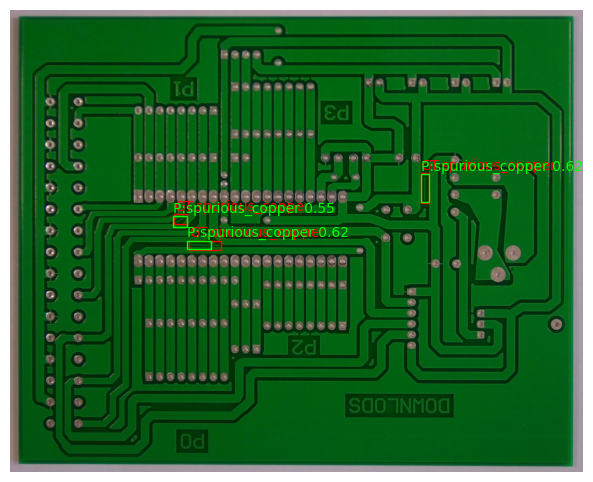


Image: yolo_data\images\val\05_missing_hole_05.jpg


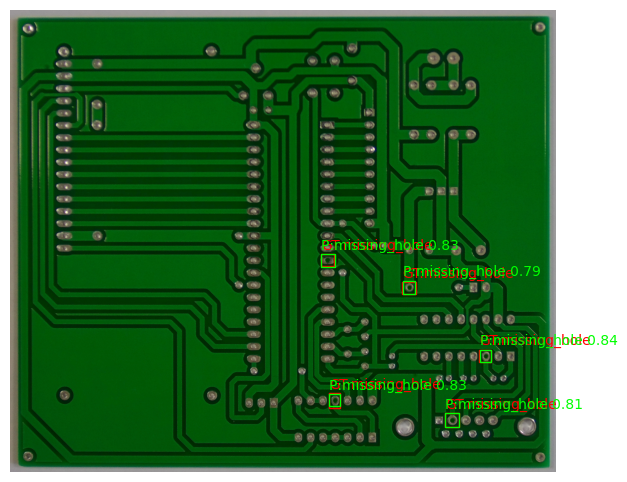


Image: yolo_data\images\val\05_missing_hole_07.jpg


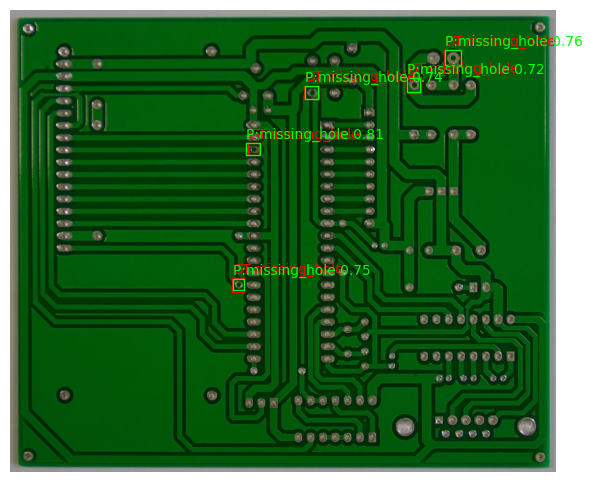


Image: yolo_data\images\val\05_missing_hole_09.jpg


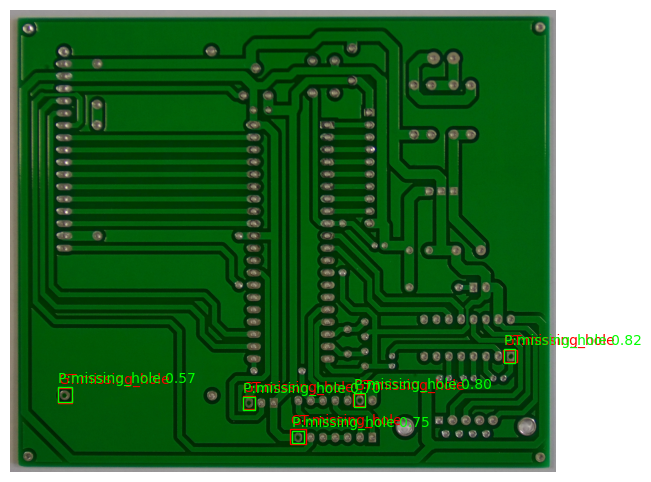


Image: yolo_data\images\val\05_mouse_bite_02.jpg


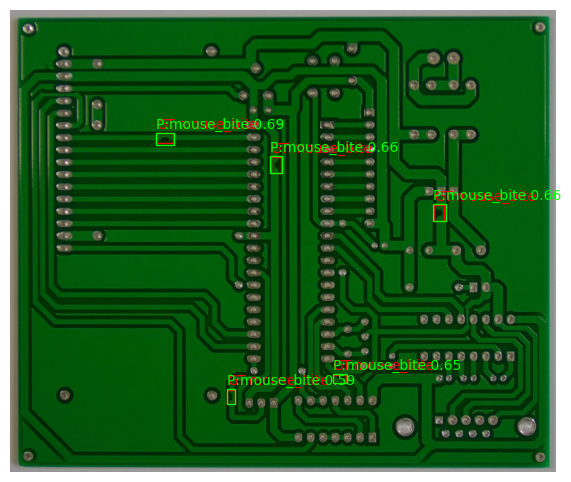


Image: yolo_data\images\val\05_mouse_bite_05.jpg


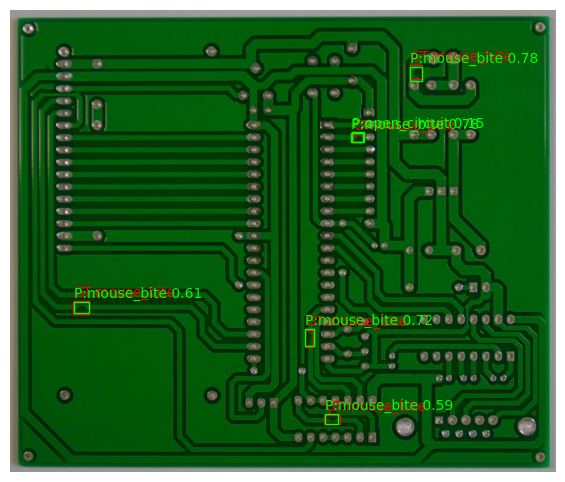


Image: yolo_data\images\val\05_mouse_bite_07.jpg


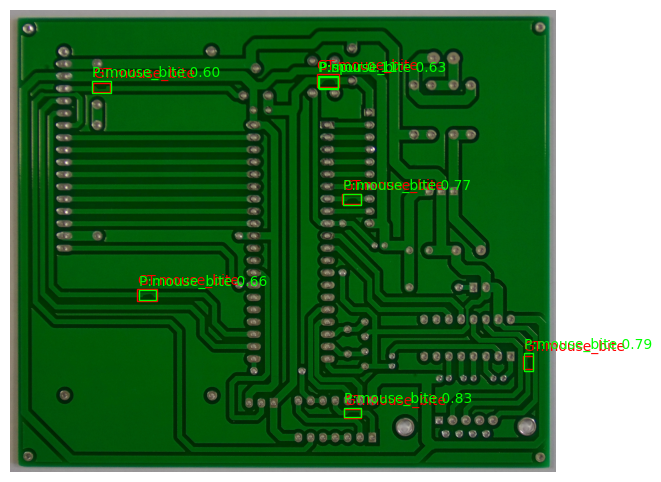


Image: yolo_data\images\val\05_mouse_bite_09.jpg


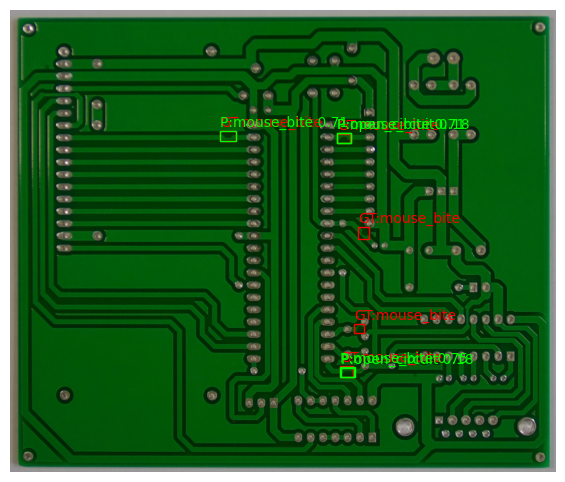


Image: yolo_data\images\val\05_open_circuit_01.jpg


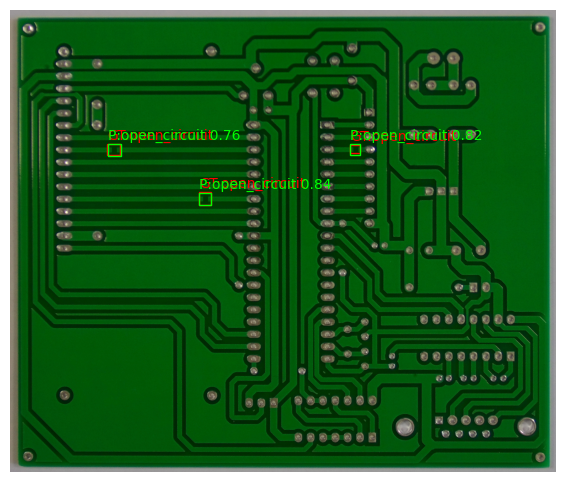

In [72]:
for r in preds2:
    print(f"\nImage: {r.path}")
    plot_gt_vs_pred_simple(r, classes, yolo_labels / "val")

## Find “No Defect, No Prediction” Images

In [59]:
from pathlib import Path
import cv2

def find_true_negative_images(preds, label_dir):
    """
    Returns list of image paths where:
    - no ground truth defect exists
    - no prediction is made by the model
    """
    true_negatives = []

    for r in preds:
        # check prediction
        has_pred = len(r.boxes) > 0

        # check ground truth
        label_path = label_dir / Path(r.path).with_suffix(".txt").name
        has_gt = label_path.exists() and label_path.stat().st_size > 0

        if not has_pred and not has_gt:
            true_negatives.append(r.path)

    return true_negatives

In [60]:
true_negative_images = find_true_negative_images(
    preds,
    yolo_labels / "val"
)

print(f"Found {len(true_negative_images)} true-negative images\n")

for img in true_negative_images[:5]:
    print(img)

Found 0 true-negative images



In [61]:
from pathlib import Path

label_dir = yolo_labels / "val"

empty_labels = [
    p for p in label_dir.glob("*.txt")
    if p.stat().st_size == 0
]

print("Empty (no-defect) label files:", len(empty_labels))

Empty (no-defect) label files: 0


### The validation split contains only defective samples. Defect-free images were evaluated separately to assess false-positive behavior.